## Linear Least Square Methode To Find H
In the previous work, we used 4 corresponding points to find the H between two images. These points were found manually and this is a hard work.

In this work we want to use some techniques like Hariss corner detection, or other feature extraction like SIFT, SURF, ORB to find features in the two images. Then by using some metrics like euqlidian distance between each point in the first image with all of the points in the second image, we find the corresponding points.

Usually this finding corresponding points method has some errors (from some pixels (noisy data) to very large ones (false data)). So if we want to automate this job, we need to find a method to push out these incorrect correspondings.

To do this job we first use RANSAC algorithm to remove the completely incorrect ones (outliers) and find the inliers for the points that has a little differnce in pixels. Then we use Linear Least Square Methode To Find H by using the inliers points.

- Read the to images

- Find the features in each image

- Find corresponding points between the two images.

- Use RANSAC to remove incorrect points

- Use LLS to find the H by using the remaining points

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [2]:
# Read images
img1 = cv2.imread("../../images/books_1.jpeg", 0)
img2 = cv2.imread("../../images/books_2.jpeg", 0)

In [3]:
# Initiate ORB detector
orb = cv2.ORB_create()

# find the keypoints with ORB
keypoints_1 = orb.detect(img1, None)
keypoints_2 = orb.detect(img2, None)

# compute the descriptors with ORB
keypoints_1, descriptors_1 = orb.compute(img1, keypoints_1)
keypoints_2, descriptors_2 = orb.compute(img2, keypoints_2)

In [15]:
# Find corresponding points
# mins = []
corresponds = []
for i, a in enumerate(descriptors_1):
    a_diff = [np.linalg.norm(a-b) for j, b in enumerate(descriptors_2)]
    # mins.append((i,np.argmin(a_diff), min(a_diff)))
    corresponds.append((i,np.argmin(a_diff)))

# mins.sort(key=lambda x: x[2])
# corresponds

In [11]:
# OpenCV feature matching
# bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
# matches = bf.match(descriptors_1, descriptors_2)
# matches = sorted(matches, key=lambda x:x.distance)

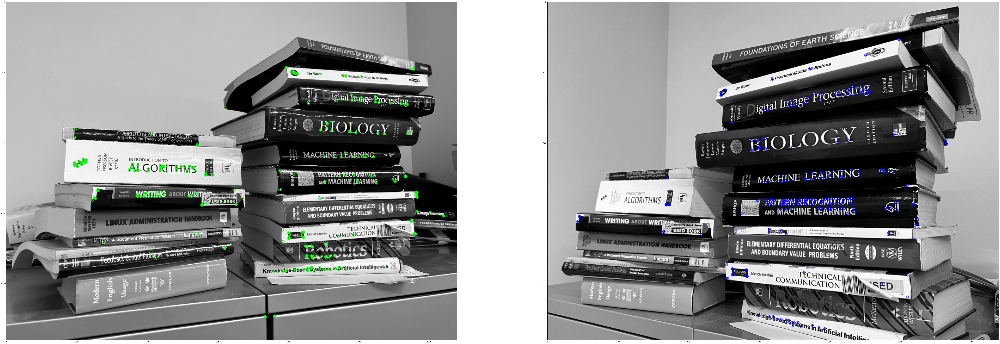

In [35]:
# draw only keypoints location,not size and orientation
img_keypoints_1 = cv2.drawKeypoints(img1, keypoints_1, None, color=(0,255,0), flags=0)
img_keypoints_2 = cv2.drawKeypoints(img2, keypoints_2, None, color=(0,0,255), flags=0)

fig = plt.figure(figsize=[100, 100])
ax1 = fig.add_subplot(1,2,1)
ax1.imshow(img_keypoints_1)
ax2 = fig.add_subplot(1,2,2)
ax2.imshow(img_keypoints_2)

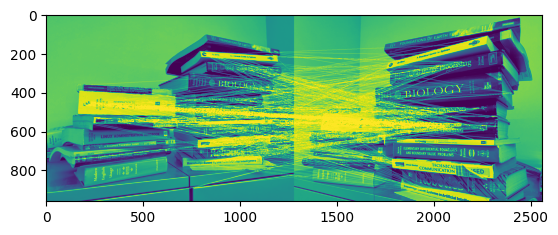

(<matplotlib.image.AxesImage at 0x73553668a900>, None)

In [36]:
# Match corresponding points
img12 = np.concatenate((img1, img2), axis=1)
for item in corresponds:
    # print(keypoints_1[item[0]].pt)
    pt1 = (int(keypoints_1[item[0]].pt[0]), int(keypoints_1[item[0]].pt[1]))
    pt2 = (int(img1.shape[1]+keypoints_2[item[1]].pt[0]), int(keypoints_2[item[1]].pt[1]))
    cv2.line( img12, pt1, pt2, (255,0,0), 1)

plt.imshow(img12), plt.show()